# Simulation of magnetic flux density distribution by coil axis

## Summary

Simulate the influence of magnetic flux density based on the orientation of two coils:

1. When the coil axis is aligned in parallel
2. When the coil axis is oriented perpendicularly
3. when the coil axis is in the torsional position

## Common

In [1]:
import magpylib as magpy
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Rectangle, Annulus
from scipy.spatial.transform import Rotation as R
import dataclasses

In [2]:
@dataclasses.dataclass
class CoilDefinition:
    """
    Coil definition
    """

    outer_diameter: float
    """ Outer diameter of the coil [m] """

    inner_diameter: float
    """ Inner diameter of the coil [m] """

    height: float
    """ Height of the coil [m] """

    wire_diameter: float
    """ Diameter of the coil wire [m] """

    current: float
    """ Current flowing through the coil [A] """

    wire_diameter: float
    """ Diameter of the coil wire [m] """
    
    current: float
    """ Current flowing through the coil [A] """

In [3]:
def create_coil(spec: CoilDefinition) -> magpy.Collection:
    coil = magpy.Collection()
    turns_height = int((spec.outer_diameter - spec.inner_diameter) / spec.wire_diameter)
    turns_perimeter = int(spec.height / spec.wire_diameter)

    for z in np.linspace(-spec.height / 2, spec.height / 2, turns_height):
        for r in np.linspace(spec.inner_diameter, spec.outer_diameter, turns_perimeter):
            winding = magpy.current.Circle(
                current=spec.current,
                diameter=r,
                position=(0, 0, z),
            )

            coil.add(winding)
    return coil

In [4]:
def plot_magnetic_flux_density(helmholtz, coil_spec: CoilDefinition, coil_positions, coil_orientations) -> None:
    fig, ax = plt.subplots(1, 1, figsize=(6, 5))

    # Compute field and plot the coil pair field on yz-grid
    grid_region = 0.1
    grid = np.mgrid[
        0:0:1j,
        -grid_region:grid_region:20j,
        -grid_region:grid_region:20j,
    ].T[:, :, 0]

    _, Y, Z = np.moveaxis(grid, 2, 0)

    magnetic_flux_density = magpy.getB(helmholtz, grid)
    _, By, Bz = np.moveaxis(magnetic_flux_density, 2, 0)

    normalized_magnetic_intensity = np.linalg.norm(magnetic_flux_density, axis=2)
    normalized_magnetic_intensity /= np.amax(normalized_magnetic_intensity)

    sp = ax.streamplot(
        Y,
        Z,
        By,
        Bz,
        density=2,
        color=normalized_magnetic_intensity,
        linewidth=np.sqrt(normalized_magnetic_intensity) * 3,
        cmap="coolwarm",
    )

    # Plot coil outline
    for (x, y, z), orientation in zip(coil_positions, coil_orientations):
        if orientation is None:
            # Regular Rectangle
            ax.add_patch(
                Rectangle(
                    xy=(y - coil_spec.outer_diameter / 2, z - coil_spec.height / 2),
                    width=coil_spec.outer_diameter,
                    height=coil_spec.height,
                    fill=False,
                    edgecolor="k",
                    zorder=10,
                )
            )
            ax.add_patch(
                Rectangle(
                    xy=(y - coil_spec.inner_diameter / 2, z - coil_spec.height / 2),
                    width=coil_spec.inner_diameter,
                    height=coil_spec.height,
                    fill=False,
                    linestyle="dashed",
                    edgecolor="k",
                    zorder=10,
                )
            )
        elif orientation.as_euler('xyz', degrees=True)[0] == 90:
            # Rotated rectangle
            ax.add_patch(
                Rectangle(
                    xy=(y - coil_spec.height / 2, z - coil_spec.outer_diameter / 2),
                    width=coil_spec.height,
                    height=coil_spec.outer_diameter,
                    fill=False,
                    edgecolor="k",
                    zorder=10,
                )
            )
            ax.add_patch(
                Rectangle(
                    xy=(y - coil_spec.height / 2, z - coil_spec.inner_diameter / 2),
                    width=coil_spec.height,
                    height=coil_spec.inner_diameter,
                    fill=False,
                    linestyle="dashed",
                    edgecolor="k",
                    zorder=10,
                )
            )
        elif orientation.as_euler("xyz", degrees=True)[1] == 90:
            # Coil Annulus
            ax.add_patch(
                Annulus(
                    xy=(y, z),
                    r=coil_spec.outer_diameter/2,
                    width=(coil_spec.outer_diameter - coil_spec.inner_diameter)/2,
                    angle=0,
                    fill=False,
                    edgecolor="k",
                    zorder=10,
                )
            )

    # Figure styling
    ax.set(
        title="Magnetic field of Helmholtz",
        xlabel="y-position (m)",
        ylabel="z-position (m)",
        aspect=1,
    )

    plt.colorbar(sp.lines, ax=ax, label="(T)")
    plt.tight_layout()
    plt.show()

## Air-core coil specification

In [5]:
# 0.5mH (od:43mm x id:26mm x h:16mm, 18AWG:1.024mm)

coil_spec = CoilDefinition(
    outer_diameter=43e-3,
    inner_diameter=26e-3,
    height=16e-3,
    wire_diameter=1.024e-3,
    current=1,
)

coil_relative_distance = 50e-3
""" Relative distance between coil axes [m] """

' Relative distance between coil axes [m] '

### Generate Coils

In [6]:
original_coil = create_coil(coil_spec)

## Simulate the effect of flux density due to coil axis

### 1. When the coil axis is aligned in parallel

In [7]:
coil_positions = [
    (0, -coil_relative_distance / 2, 0),
    (0, coil_relative_distance / 2, 0),
]
coil_orientations = [
    None,
    None,
]

In [8]:
# コイルを生成する
coil1 = original_coil.copy()
coil2 = original_coil.copy()

# コイルの位置を定義する
coil1.position = coil_positions[0]
coil1.orientation = coil_orientations[0]

coil2.position = coil_positions[1]
coil2.orientation = coil_orientations[1]

# Helmholtz 空間にコイルを配置する
helmholtz = magpy.Collection(coil1, coil2)
helmholtz.show()

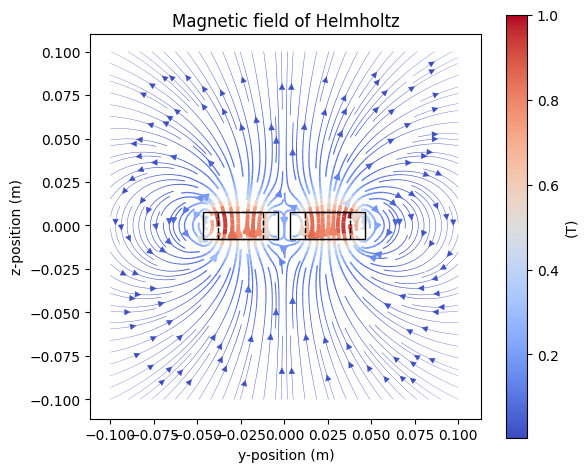

In [9]:
plot_magnetic_flux_density(helmholtz=helmholtz, coil_spec=coil_spec, coil_positions=coil_positions,coil_orientations=coil_orientations)

### 2. When the coil axis is oriented perpendicularly

In [19]:
coil_positions = [
    (0, -coil_relative_distance / 2, 0),
    (
        0,
        coil_relative_distance / 2,
        coil_spec.outer_diameter - coil_spec.inner_diameter,
    ),
]
coil_orientations = [
    None,
    R.from_euler("x", 90, degrees=True),
]

In [20]:
# コイルを生成する
coil1 = original_coil.copy()
coil2 = original_coil.copy()

# コイルの位置を定義する
coil1.position = coil_positions[0]
coil1.orientation = coil_orientations[0]

coil2.position = coil_positions[1]
coil2.orientation = coil_orientations[1]

# Helmholtz 空間にコイルを配置する
helmholtz = magpy.Collection(coil1, coil2)
helmholtz.show()

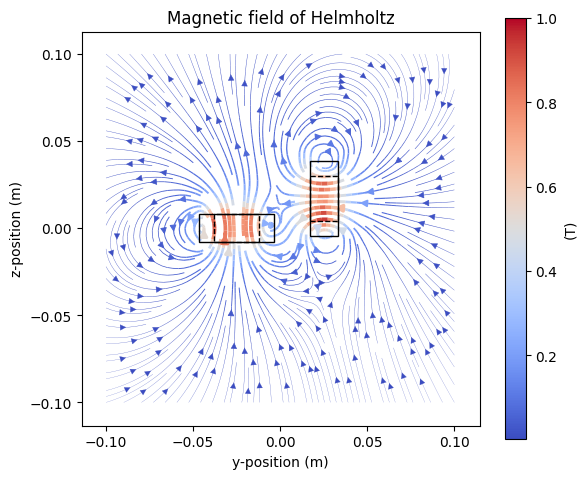

In [21]:
plot_magnetic_flux_density(helmholtz=helmholtz, coil_spec=coil_spec, coil_positions=coil_positions,coil_orientations=coil_orientations)

### 3. when the coil axis is in the torsional position

In [24]:
coil_positions = [
    (0, -coil_relative_distance / 2, 0),
    (
        0,
        coil_relative_distance / 2,
        coil_spec.outer_diameter - coil_spec.inner_diameter,
    ),
]
coil_orientations = [
    None,
    R.from_euler("y", 90, degrees=True),
]

In [25]:
# コイルを生成する
coil1 = original_coil.copy()
coil2 = original_coil.copy()

# コイルの位置を定義する
coil1.position = coil_positions[0]
coil1.orientation = coil_orientations[0]

coil2.position = coil_positions[1]
coil2.orientation = coil_orientations[1]

# Helmholtz 空間にコイルを配置する
helmholtz = magpy.Collection(coil1, coil2)
helmholtz.show()

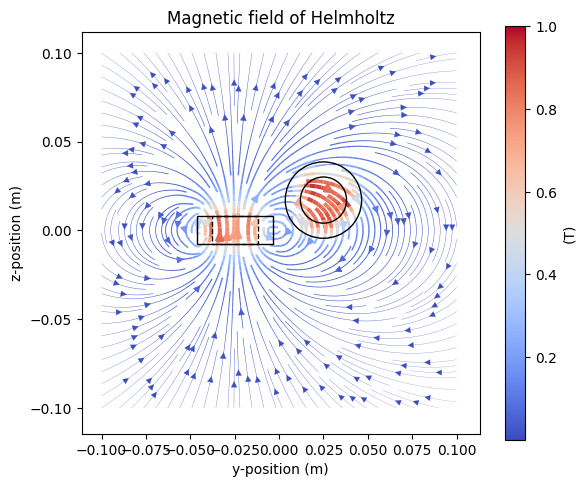

In [26]:
plot_magnetic_flux_density(helmholtz=helmholtz, coil_spec=coil_spec, coil_positions=coil_positions,coil_orientations=coil_orientations)